<a href="https://colab.research.google.com/github/xxx-holic-01/Caltech_classifier/blob/main/IMGclassifier_OPT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
import pickle
from tensorflow import keras

from PIL import Image
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Directory with daisy pictures
chairs_dir = os.path.join('/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/chairs')

# Directory with dandelion pictures
shoes_dir = os.path.join('/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes')

# Directory with rose pictures
sofas_dir = os.path.join('/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/sofas')

# Directory with sunflower pictures
bed_dir = os.path.join('/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/bed')

# Directory with tulip pictures
table_dir = os.path.join('/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/table')

In [ ]:
train_chairs_names = os.listdir(chairs_dir)
print(train_chairs_names[:5])

train_shoes_names = os.listdir(shoes_dir)
print(train_shoes_names[:5])

train_sofa_names = os.listdir(sofas_dir)
print(train_sofa_names[:5])

train_bed_names = os.listdir(bed_dir)
print(train_bed_names[:5])

train_table_names = os.listdir(table_dir)
print(train_table_names[:5])

['REFIMGC002LP5TG9GUZ.jpg', 'REFIMGC7VEUDCMJNH0G.jpg', 'REFIMGC3RFG4MDTD6W5.jpg', 'REFIMGCFFWXJYLRK6PN.jpg', 'REFIMGCBRWRNJ8PV193.jpg']
['REFIMGC1NL3UBNWQP0P.jpg', 'REFIMGC1D4WZ9C2MVQZ.jpg', 'REFIMGC3449H6VNDLWE.jpg', 'REFIMGC51NB8PTYZ31R.jpg', 'REFIMGC3U9DAPB42MW6.jpg']
['REFIMGC25JAKBWK8V2F.jpg', 'REFIMGC14LFQC4V2LAK.jpg', 'REFIMGC48EHYDKQ90BY.jpg', 'REFIMGC39XAJ3CUNF81.jpg', 'REFIMGC7LQXNE1263D9.jpg']
['REFIMGC4N7VELX4KPF1.jpg', 'REFIMGCAYBRY5UTCVGV.jpg', 'REFIMGCFMZAJMHQDURT.jpg', 'REFIMGCAM7D88K3PGHL.jpg', 'REFIMGCX3UDZ43PJKN8.jpg']
['REFIMGC39WV7K7PQL51.jpg', 'REFIMGCYDYT4G1JYTCM.jpg', 'REFIMGCXX4F1T6D9LJ4.jpg', 'REFIMGCZWEQKCBZ2T4F.jpg']


In [ ]:
print('total chairs images:', len(os.listdir(chairs_dir)))
print('total shoes images:', len(os.listdir(shoes_dir)))
print('total sofas images:', len(os.listdir(sofas_dir)))
print('total bed images:', len(os.listdir(bed_dir)))
print('total table images:', len(os.listdir(table_dir)))

total chairs images: 18
total shoes images: 26
total sofas images: 14
total bed images: 5
total table images: 4


Showing some chairs pictures...



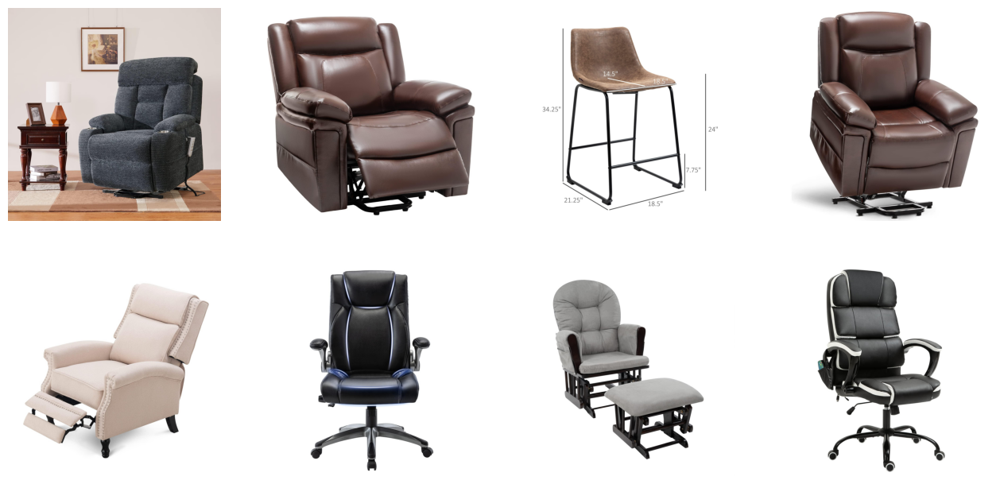

Showing some shoes pictures...



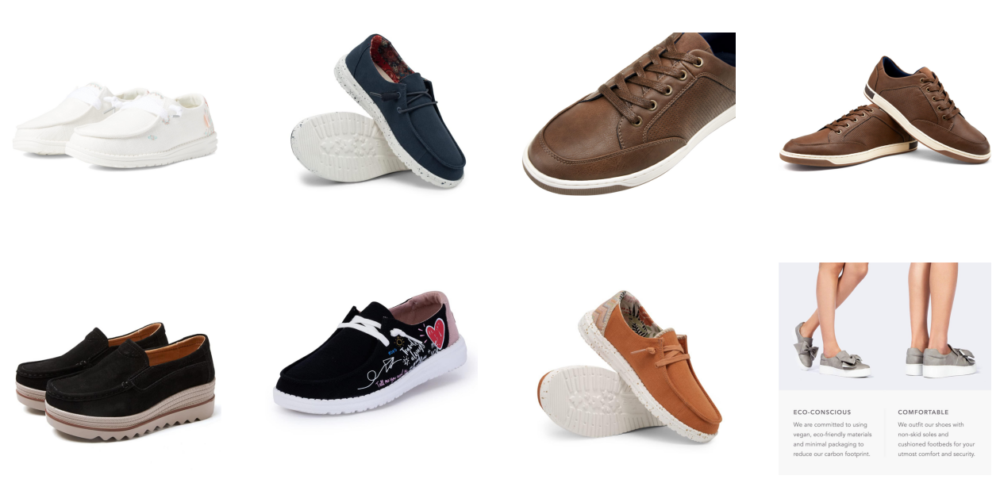

Showing some sofa pictures...



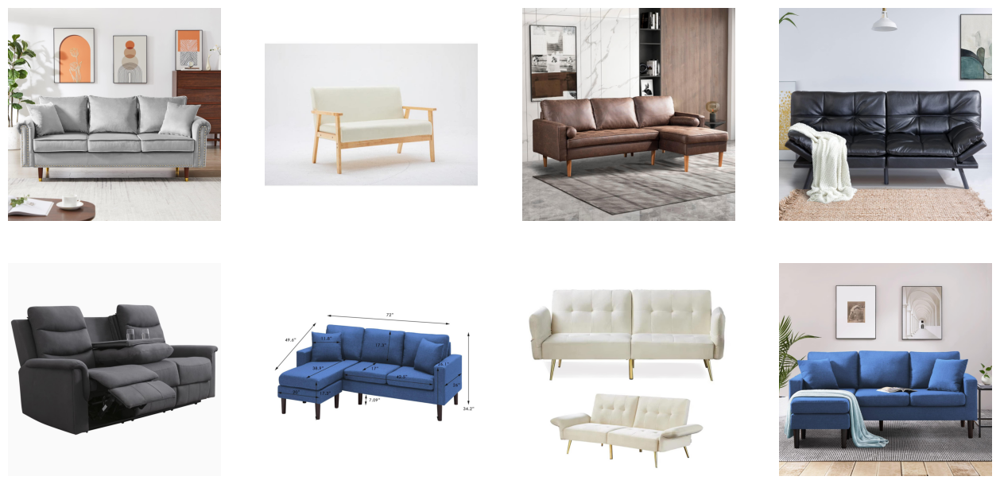

Showing some bed pictures...



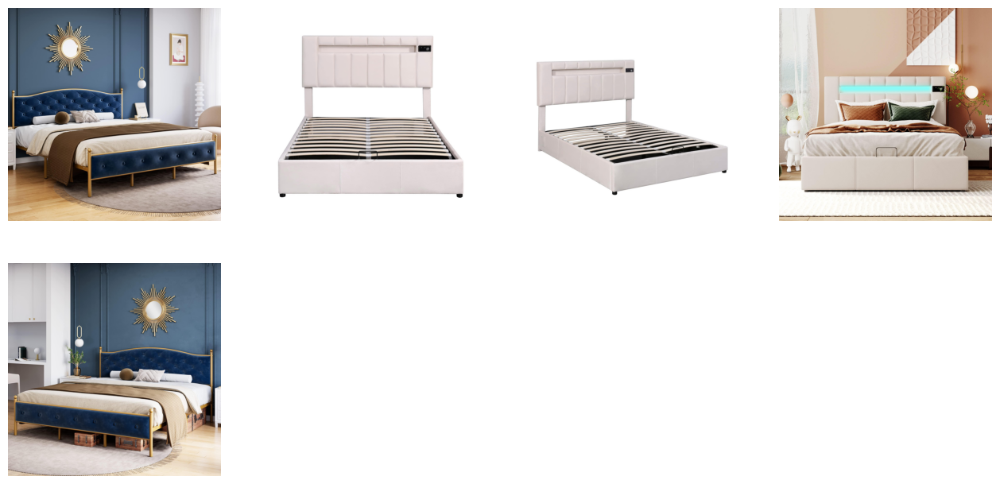

Showing some table pictures...



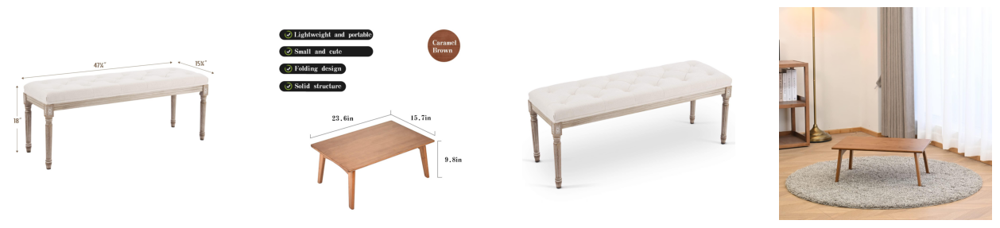

In [ ]:
# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 0

fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_chairs_pix = [os.path.join(chairs_dir, fname) 
                for fname in train_chairs_names[pic_index-8:pic_index]]
next_shoes_pix = [os.path.join(shoes_dir, fname) 
                for fname in train_shoes_names[pic_index-8:pic_index]]
next_sofa_pix = [os.path.join(sofas_dir, fname) 
                for fname in train_sofa_names[pic_index-8:pic_index]]
next_bed_pix = [os.path.join(bed_dir, fname) 
                for fname in train_bed_names[pic_index-8:pic_index]]
next_table_pix = [os.path.join(table_dir, fname) 
                for fname in train_table_names[pic_index-8:pic_index]]

print ("Showing some chairs pictures...")
print()
for i, img_path in enumerate(next_chairs_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)
  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

print ("Showing some shoes pictures...")
print()
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)
for i, img_path in enumerate(next_shoes_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()


print ("Showing some sofa pictures...")
print()
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)
for i, img_path in enumerate(next_sofa_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

print ("Showing some bed pictures...")
print()
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)
for i, img_path in enumerate(next_bed_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

print ("Showing some table pictures...")
print()
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)
for i, img_path in enumerate(next_table_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

In [ ]:
#Encapsulate all of these in a single function?

In [ ]:
def train_CNN(train_directory,target_size=(200,200), classes=None,
              batch_size=128,num_epochs=20,num_classes=5,verbose=0):
    """
    Trains a conv net for the flowers dataset with a 5-class classifiction output
    Also provides suitable arguments for extending it to other similar apps
    
    Arguments:
            train_directory: The directory where the training images are stored in separate folders.
                            These folders should be named as per the classes.
            target_size: Target size for the training images. A tuple e.g. (200,200)
            classes: A Python list with the classes 
            batch_size: Batch size for training
            num_epochs: Number of epochs for training
            num_classes: Number of output classes to consider
            verbose: Verbosity level of the training, passed on to the `fit_generator` method
    Returns:
            A trained conv net model
    
    """

    
    # ImageDataGenerator object instance with scaling
    train_datagen = ImageDataGenerator(rescale=1/255)

    # Flow training images in batches using the generator
    train_generator = train_datagen.flow_from_directory(
            train_directory,  # This is the source directory for training images
            target_size=target_size,  # All images will be resized to 200 x 200
            batch_size=batch_size,
            # Specify the classes explicitly
            classes = classes,
            # Since we use categorical_crossentropy loss, we need categorical labels
            class_mode='categorical')
    
    input_shape = tuple(list(target_size)+[3])
    
       # Model architecture
    model = tf.keras.models.Sequential([
    # Note the input shape is the desired size of the image 200x 200 with 3 bytes color
    # The first convolution
    tf.keras.layers.Conv2D(16, (3,3), activation='relu', input_shape=input_shape),
    tf.keras.layers.MaxPooling2D(2, 2),
    # The second convolution
    tf.keras.layers.Conv2D(32, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The third convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fourth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # The fifth convolution
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),
    # Flatten the results to feed into a dense layer
    tf.keras.layers.Flatten(),
    # 512 neuron in the fully-connected layer
    tf.keras.layers.Dense(512, activation='relu'),
    # 5 output neurons for 5 classes with the softmax activation
    tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
     # Optimizer and compilation
    model.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(lr=0.001),
              metrics=['acc'])
    
    # Total sample count
    total_sample=train_generator.n
    
    
    global history
    # Training
    history = model.fit_generator(
        train_generator, 
        epochs=num_epochs,
        verbose=verbose)
    accuracy = history.history['acc']
    loss = history.history['loss']
    print("Training Accuracy:", accuracy[-1]*100)
    print("losses:", loss[-1]*100)
    
    
    return model

In [ ]:
train_directory = "/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders"

In [ ]:
n_epochs=28

In [ ]:
model_caltech101 = train_CNN(train_directory=train_directory,classes=['chair','shoes','sofa','bed','table'],batch_size=4,num_epochs=n_epochs,num_classes=5,verbose=1)

Found 35 images belonging to 5 classes.


Epoch 1/28


<ipython-input-19-142af001be79>:73: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


9/9 [==============================] - 4s 306ms/step - loss: 2.7215 - acc: 0.6857
Epoch 2/28
9/9 [==============================] - 3s 277ms/step - loss: 1.0717 - acc: 0.7429
Epoch 3/28
9/9 [==============================] - 3s 282ms/step - loss: 1.0583 - acc: 0.7429
Epoch 4/28
9/9 [==============================] - 3s 288ms/step - loss: 0.8321 - acc: 0.7429
Epoch 5/28
9/9 [==============================] - 5s 505ms/step - loss: 0.7920 - acc: 0.7714
Epoch 6/28
9/9 [==============================] - 3s 283ms/step - loss: 0.7954 - acc: 0.8000
Epoch 7/28
9/9 [==============================] - 3s 267ms/step - loss: 0.5795 - acc: 0.8000
Epoch 8/28
9/9 [==============================] - 3s 341ms/step - loss: 0.4295 - acc: 0.8286
Epoch 9/28
9/9 [==============================] - 3s 290ms/step - loss: 0.4037 - acc: 0.8286
Epoch 10/28
9/9 [==============================] - 3s 290ms/step - loss: 0.3663 - acc: 0.9143
Epoch 11/28
9/9 [==============================] - 4s 476ms/step - loss: 0.2368 

In [ ]:
model_caltech101.save("model_caltech101.h5")
model_caltech101 = keras.models.load_model("model_caltech101.h5")

In [ ]:
model_caltech101.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 198, 198, 16)      448       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 99, 99, 16)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 97, 97, 32)        4640      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 48, 48, 32)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 46, 46, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 23, 23, 64)      

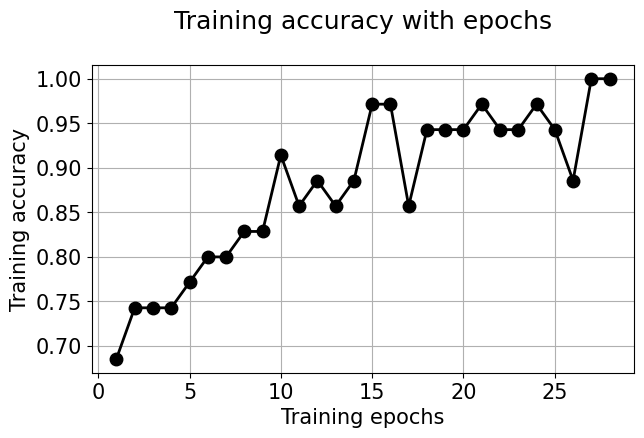

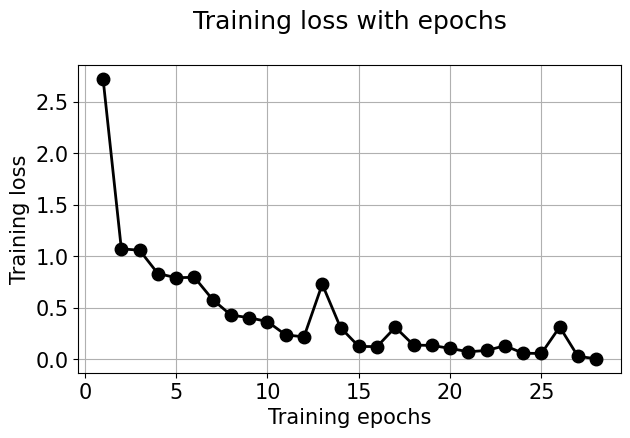

In [ ]:
#Plot the accuracy/loss over the progression of training (epochs)
plt.figure(figsize=(7,4))

plt.plot([i+1 for i in range(n_epochs)],history.history['acc'],'-o',c='k',lw=2,markersize=9)
plt.grid(True)
plt.title("Training accuracy with epochs\n",fontsize=18)
plt.xlabel("Training epochs",fontsize=15)
plt.ylabel("Training accuracy",fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

plt.figure(figsize=(7,4))
plt.plot([i+1 for i in range(n_epochs)],history.history['loss'],'-o',c='k',lw=2,markersize=9)
plt.grid(True)
plt.title("Training loss with epochs\n",fontsize=18)
plt.xlabel("Training epochs",fontsize=15)
plt.ylabel("Training loss",fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

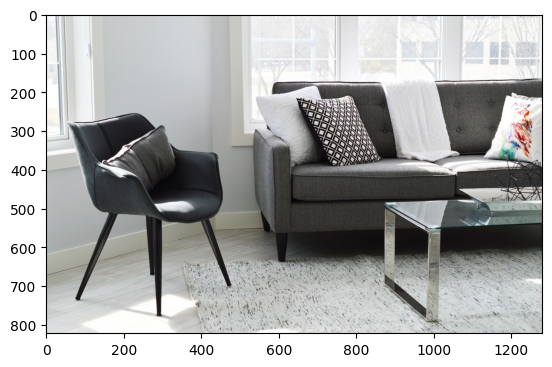

In [ ]:
#prediction
img_path = '/content/chair.jpg'
img_chair = mpimg.imread(img_path)
plt.imshow(img_chair)
plt.show()



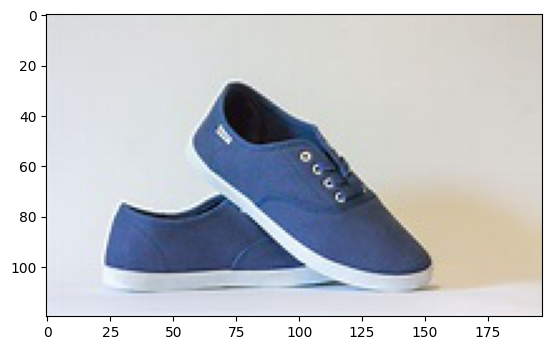

In [ ]:
img_path = '/content/shoes.jpeg'
img_shoes = mpimg.imread(img_path)
plt.imshow(img_shoes)
plt.show()


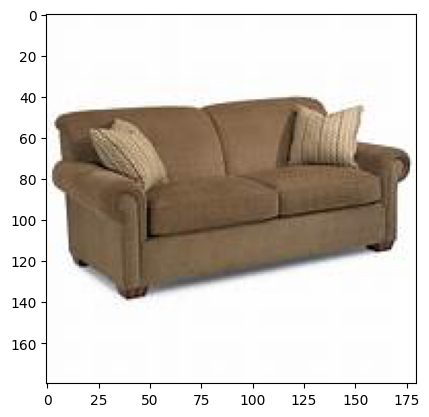

In [ ]:
img_path = '/content/sofa.jpeg'
img_sofa = mpimg.imread(img_path)
plt.imshow(img_sofa)
plt.show()

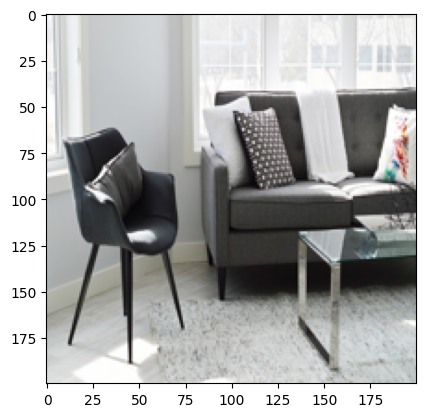

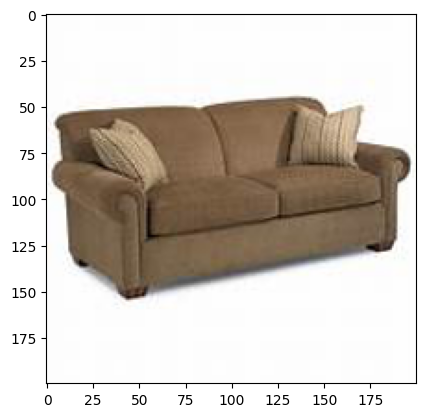

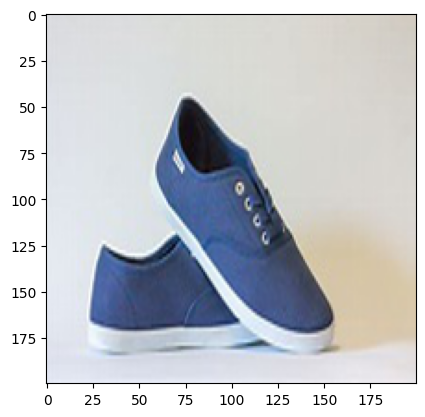

In [ ]:
from PIL import Image
img_chair=Image.open('/content/chair.jpg')
img_sofa=Image.open('/content/sofa.jpeg')
img_shoes=Image.open('/content/shoes.jpeg')

img_chair = img_chair.convert("RGB")
img_sofa = img_sofa.convert("RGB")
img_shoes = img_shoes.convert("RGB")

img_chair = img_chair.resize((200,200))
img_shoes = img_shoes.resize((200,200))
img_sofa= img_sofa.resize((200,200))


plt.imshow(img_chair)
plt.show()

plt.imshow(img_sofa)
plt.show()

plt.imshow(img_shoes)
plt.show()
# Expand dimensions for proper prediction

img_chair=np.expand_dims(img_chair,axis=0)
img_sofa=np.expand_dims(img_sofa,axis=0)
img_shoes=np.expand_dims(img_shoes,axis=0)

In [ ]:
array_category=model_caltech101.predict(img_shoes)
if(array_category[0][0]==1):
   {
      print("image belonges to chairs category",array_category[0][0])
   }
elif (array_category[0][1]==1):
   {
      print("image belonges to shoes category",array_category[0][1])
   }
elif (array_category[0][2]==1):
   {
      print("image belonges to sofa category", array_category[0][2])
   }
elif (array_category[0][3]==1):
   {
      print("image belonges to bed category", array_category[0][3])
   }
elif (array_category[0][4]==1):
   {
      print("image belonges to table category", array_category[0][4])
   }
else:
   {
      print(array_category)
   }
 
# 'chair','shoes','sofa','bed','table'

1/1 [==============================] - 0s 40ms/step
image belonges to shoes category 1.0


In [ ]:
#classification done 

In [ ]:
# SIMILARITY VGG16 MODEL

In [ ]:
#-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

1/1 [==============================] - 1s 957ms/step


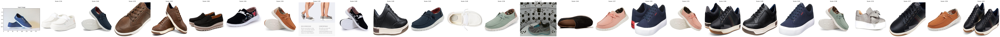

In [ ]:
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x

def extract_features(img_path):
    x = preprocess_image(img_path)
    features = model.predict(x)
    return features.flatten()

def calculate_similarity(input_image_path, folder_path):
    input_features = extract_features(input_image_path)
    similarity_scores = []

    for filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, filename)
        image_features = extract_features(image_path)
        similarity_score = np.dot(input_features, image_features) / (np.linalg.norm(input_features) * np.linalg.norm(image_features))
        similarity_scores.append(similarity_score)

    return similarity_scores

# Load the VGG16 model
base_model = VGG16(weights='imagenet')
model = Model(inputs=base_model.input, outputs=base_model.get_layer('fc2').output)

# Set the paths for the input image and the folder containing the images
input_image_path = '/content/shoes.jpeg'
image_folder_path = '/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes'


# Calculate similarity scores
similarity_scores = calculate_similarity(input_image_path, image_folder_path)

# Load and plot the input image
input_image = Image.open(input_image_path)

# Set up the figure and subplots
num_images = len(similarity_scores)
fig, axes = plt.subplots(1, num_images + 1, figsize=(5* (num_images + 1), 5))
axes[0].imshow(input_image)
axes[0].set_title('Input Image')

# Plot the folder images with similarity scores
for i, filename in enumerate(os.listdir(image_folder_path)):
    image_path = os.path.join(image_folder_path, filename)
    img = Image.open(image_path)
   
    axes[i + 1].imshow(img, aspect='auto')
    axes[i + 1].set_title(f'Score: {similarity_scores[i]:.2f}')
    axes[i + 1].axis('off')


   
plt.tight_layout(pad=0.5)
plt.show()


In [ ]:
import os

directory_path = '/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/'

# Iterate over the files in the 'shoes' directory
for filename in os.listdir(directory_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        file_path = os.path.join(directory_path, filename)
        print(file_path)



/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/REFIMGC1NL3UBNWQP0P.jpg
/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/REFIMGC1D4WZ9C2MVQZ.jpg
/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/REFIMGC3449H6VNDLWE.jpg
/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/REFIMGC51NB8PTYZ31R.jpg
/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/REFIMGC3U9DAPB42MW6.jpg
/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/REFIMGCJK7Q86MYYGP4.jpg
/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/REFIMGCACMQ9U9UPVLW.jpg
/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/REFIMGCC45FE0THMHPU.jpg
/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/REFIMGCC7G5B0GG7BKF.jpg
/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/REFIMGCG7BPA0FUDLB6.jpg
/content/drive/MyDrive/ImageSimilarityCode/categorywisefolders/shoes/R